## Table of Content:
* [Introduction](#first-bullet)
* [World wide Pollution](#second-bullet)
* [PM2.5](#third-bullet)
* [PM10](#fourth-bullet)
* [NO2](#fifth-bullet)
* [A real success story](#sixth-bullet)
* [Death Rate](#seventh-bullet)
* [Why are we dying of air pollution?](#eight-bullet)
* [What does the future hold for us?](#ninth-bullet)
* [References](#tenth-bullet)
-------------------

<h1><center>
 
## Is air pollution killing us slowly? <a class="anchor" id="None"></a>

</center></h1>


<h6><center>
 
### Close your eyes and imagine breathing in fresh, clean air.   

</center></h6>


-----------

<a class="anchor" id="first-bullet"></a>

<p style="text-align: center;"> Now imagine that the air around you is dusty or smoky, and try to breathe in. Your eyes will most likely get irritated and so will your nose, throat, and lungs. You might even have a hard time breathing. These are just some of the immediate symptoms you’ll experience from bad air quality.</p> 
    
<p style="text-align: center;"> The sad truth is that this is the everyday life for some. However, most often, you are not even able to tell if the air quality is unhealthy for you. Today, 9 out of 10 of us actually live in places where the air we breathe exceeds the guideline limit stated by the World Human Organisation, WHO [9]. 
That is most likely far more than you would have guessed. </p> 

<p style="text-align: center;"> <b> Is the air you breath safe?</b></p> 

<p style="text-align: center;"> Particles are one of the major public concerns as it causes respiratory and other diseases that can lead to premature deaths [9]. Smoke from fires and emissions from power plants, industrial facilities and cars and trucks are some of the common sources of air pollution including particle pollution (PM2.5). Dust from roads, agriculture, dry riverbeds, construction sites, and mines also contribute to particle pollution (PM10). Other pollutants such as carbon monoxide (CO), ozone (O3), nitrogen dioxide (NO2), and sulphur dioxide (SO2) are also common causes of air pollution [10]. </p> 

<p style="text-align: center;"> Air pollution is not only one of the greatest environmental risks to health [9]. Air pollution affects both people and the planet as many air pollution sources are also sources of greenhouse gas emissions. By reducing pollutant concentrations, it is possible to reduce the diseases that causes premature deaths as well limit the contributions to climate change. This means that both the planet and people will gain from reducing air pollution. </p> 


<p style="text-align: center;"> We will take you through the history of certain particle and pollutant concentrations around the world, how it has changed throughout the past years worldwide, in the five cities with the highest and lowest concentrations in the world, respectively, and in six specific cities in six different countries around the world. </p> 


<!-- <div>
<img src="airpollution2.jpg" width="600"/>
</div> -->

----------

<a class="anchor" id="second-bullet"></a>

<p style="text-align: center;"> In the plot below, you can see how the concentrations of three different pollutants of major public concern, PM2.5, PM10, and NO2, have changed worldwide throughout the past six years. The dotted lines are the guideline limits stated by WHO. For PM2.5, the guideline limit is 10 μg/m3, and for PM10 and NO2, the guideline limit is 20 μg/m3. As you can see, the sad truth is that the world average concentrations of PM2.5 and PM10 are far above the guideline limits stated by WHO. Only the world average concentration of NO2 is below the guideline limit.  </p> 


In [1]:
# Initialization
import warnings
warnings.filterwarnings('ignore')
import math
import random
import pandas as pd
import numpy as np
import seaborn as sns
import collections
import os

# import datetime as dt
import matplotlib.pyplot as plt
from matplotlib.pyplot import cm
import plotly.express as px


import bokeh.io
import bokeh.plotting as bk
from bokeh.plotting import figure, show, output_file
from bokeh.models import Legend, ColumnDataSource, FactorRange, Span, Grid, LinearAxis, Plot,  HoverTool
from bokeh.io import output_file, output_notebook, curdoc, show
from bokeh.transform import factor_cmap, dodge
from bokeh.palettes import Category20b
from bokeh.models.widgets import Panel, Tabs
from bokeh.resources import INLINE

bokeh.io.output_notebook(INLINE)

import scipy, pylab

import datetime
from datetime import datetime
from pandas.tseries.offsets import DateOffset

from scipy import stats
from scipy.stats import ttest_ind

import folium
from folium import plugins, LayerControl
from folium.plugins import HeatMap, MarkerCluster, BeautifyIcon

from sklearn import preprocessing, tree, metrics

import branca
import branca.colormap as cm


from urllib.request import urlopen
import json



Loading BokehJS ...

In [2]:
# Download dataset (population)
df_pop = pd.read_csv(r'worldcities.csv')
# Create table
df = pd.DataFrame()  

# Create list of file names to be downloaded
years = ['2021Q1', '2021Q2', '2021Q3', '2021Q4', '2020Q1', '2020Q2', '2020Q3', '2020Q4',
         '2019Q1', '2019Q2', '2019Q3', '2019Q4', '2018H1', '2017H1', '2016H1']

# Create dataset (particle concentration)
for i in range(len(years)-1):
    filename = 'downloaded'+years[i]+'.csv'    
    df1 = pd.read_csv(filename, skiprows=4)
    df = pd.concat([df,df1], ignore_index=True)
    # Create table
    
df = pd.DataFrame()  

# Create list of file names to be downloaded
years = ['2021Q1', '2021Q2', '2021Q3', '2021Q4', '2020Q1', '2020Q2', '2020Q3', '2020Q4',
         '2019Q1', '2019Q2', '2019Q3', '2019Q4', '2018H1', '2017H1', '2016H1']

# Create dataset (particle concentration)
for i in range(len(years)-1):
    filename = 'downloaded'+years[i]+'.csv'    
    df1 = pd.read_csv(filename, skiprows=4)
    df = pd.concat([df,df1], ignore_index=True)
    
    
df_pm25 = df[df['Specie'] =='pm25']

city_list = np.unique(df_pm25['City'])

df_pm25['Date'] = pd.to_datetime(df['Date'])

list_count = []
city_count = []

for i in range(len(city_list)):
    country1 = df_pm25[df_pm25['City'] == city_list[i]]
    resampled = country1.resample('Y', on='Date', origin='start').mean()
    resampled = resampled[resampled['median'].notna()]
    resampled = resampled.reset_index()
    resampled = resampled[resampled['Date'] > datetime.fromisoformat("2015-12-31")] 
    resampled = resampled[resampled['Date'] < datetime.fromisoformat("2022-12-31")] 
    resampled['Date'] = resampled['Date'] - DateOffset(months=12)
    if len(resampled) > 5:
        if np.mean(resampled['median']) < 300:
            list_count.append(resampled)
            city_count.append(city_list[i])
    
list_count_new = []
city_count_new = []

df_pop.drop_duplicates(subset ="city_ascii", keep = False, inplace = True)

for i in range(len(list_count)):
    if city_count[i] in list(df_pop['city_ascii']):
        if float(df_pop[df_pop['city_ascii'] == city_count[i]]['population']) > 1000000:
            list_count_new.append(list_count[i])
            city_count_new.append(city_count[i])

list_count = list_count_new
city_count = city_count_new

median_ave = []
cities = []

for i in range(len(list_count)):
    median_ave.append(np.mean(list_count[i]['median']))
    cities.append(city_count[i])
    
d = {'median': median_ave, 'cities': cities}

allcitiespm25 = pd.DataFrame(data=d)
allcitiespm25 = allcitiespm25.sort_values(by=['median'])

worldcitiespm25 = allcitiespm25['cities']

bot5pm25 = allcitiespm25['cities'].tail(5)
top5pm25 = allcitiespm25['cities'].head(5)

selectedcities = ['Kolkata','Brisbane','Beijing','Mexico City','Tehran','Copenhagen']

average_top5pm25 = []
average_bot5pm25 = []
average_worldcitiespm25 = []
averagepm25 = []

for j in range(6):
    averagepm25 =[]
    for i in range(len(list_count)):
        if cities[i] in list(top5pm25):     
            averagepm25.append(list_count[i]['median'][j])
    average_top5pm25.append(np.mean(averagepm25))

averagepm25 = []

for j in range(6):
    averagepm25 =[]
    for i in range(len(list_count)):
        if cities[i] in list(bot5pm25):     
            averagepm25.append(list_count[i]['median'][j])
    average_bot5pm25.append(np.mean(averagepm25))

averagepm25 = []

for j in range(6):
    averagepm25 =[]
    for i in range(len(list_count)):
        if cities[i] in list(worldcitiespm25):     
            averagepm25.append(list_count[i]['median'][j])
    average_worldcitiespm25.append(np.mean(averagepm25))    
df_pm25 = df[df['Specie'] == 'pm10']

city_list = np.unique(df_pm25['City'])

df_pm25['Date'] = pd.to_datetime(df['Date'])

list_count = []
city_count = []

listkolkata = ['Kolkata']

for i in range(len(city_list)):
    country1 = df_pm25[df_pm25['City'] == city_list[i]]
    country1 = country1.drop(country1[country1['median'] > 300].index)
    resampled = country1.resample('Y', on = 'Date', origin = 'start').mean()
    resampled = resampled[resampled['median'].notna()]
    resampled = resampled.reset_index()
    resampled = resampled[resampled['Date'] > datetime.fromisoformat("2015-12-31")] 
    resampled = resampled[resampled['Date'] < datetime.fromisoformat("2022-12-31")] 
    resampled['Date'] = resampled['Date'] - DateOffset(months=12)
    if len(resampled) > 5:
        if np.mean(resampled['median']) < 300:
            list_count.append(resampled)
            city_count.append(city_list[i])
list_count_new = []
city_count_new = []

df_pop.drop_duplicates(subset = "city_ascii", keep = False, inplace = True)

for i in range(len(list_count)):
    if city_count[i] in list(df_pop['city_ascii']):
        if float(df_pop[df_pop['city_ascii'] == city_count[i]]['population']) > 1000000:
            list_count_new.append(list_count[i])
            city_count_new.append(city_count[i])

list_count = list_count_new
city_count = city_count_new
median_ave = []
cities = []

for i in range(len(list_count)):
    median_ave.append(np.mean(list_count[i]['median']))
    cities.append(city_count[i])
    
d = {'median': median_ave, 'cities': cities}

allcitiespm10 = pd.DataFrame(data = d)
allcitiespm10 = allcitiespm10.sort_values(by = ['cities'])

allcitiespm10.drop_duplicates(keep = 'first', inplace = True)
worldcitiespm10 = allcitiespm10['cities']

allcitiespm10 = allcitiespm10.sort_values(by = ['median'])

bot5pm10 = allcitiespm10['cities'].tail(5)
top5pm10 = allcitiespm10['cities'].head(5)
average_top5pm10 = []
average_bot5pm10 = []
average_worldcitiespm10 = []

averagepm10 = []

for j in range(6):
    averagepm10 = []
    for i in range(len(list_count)):
        if cities[i] in list(top5pm10):     
            averagepm10.append(list_count[i]['median'][j])

    average_top5pm10.append(np.mean(averagepm10))

averagepm10 = []

for j in range(6):
    averagepm10 = []
    for i in range(len(list_count)):
        if cities[i] in list(bot5pm10):     
            averagepm10.append(list_count[i]['median'][j])

    average_bot5pm10.append(np.mean(averagepm10))     

averagepm10 = []

for j in range(6):
    averagepm10 = []
    for i in range(len(list_count)):
        if cities[i] in list(worldcitiespm10):     
            averagepm10.append(list_count[i]['median'][j])

    average_worldcitiespm10.append(np.mean(averagepm10))    

df_pm25 = df[df['Specie'] =='no2']
city_list = np.unique(df_pm25['City'])
df_pm25['Date'] = pd.to_datetime(df['Date'])

list_count = []
city_count = []

for i in range(len(city_list)):
    country1 = df_pm25[df_pm25['City'] == city_list[i]]
    resampled = country1.resample('Y', on='Date').mean()
    resampled = resampled[resampled['median'].notna()]
    resampled = resampled.reset_index()
    resampled = resampled[resampled['Date'] > datetime.fromisoformat("2015-12-31")] 
    resampled = resampled[resampled['Date'] < datetime.fromisoformat("2022-12-31")] 
    resampled['Date'] = resampled['Date'] - DateOffset(months=12)
    if len(resampled) > 5:
        if all(resampled['median']<300):
            list_count.append(resampled)
            city_count.append(city_list[i])
list_count_new = []
city_count_new = []

df_pop.drop_duplicates(subset ="city_ascii", keep = False, inplace = True)

for i in range(len(list_count)):
    if city_count[i] in list(df_pop['city_ascii']):
        if float(df_pop[df_pop['city_ascii'] == city_count[i]]['population']) > 1000000:
            list_count_new.append(list_count[i])
            city_count_new.append(city_count[i])

list_count = list_count_new
city_count = city_count_new
median_ave = []
cities = []

for i in range(len(list_count)):
    median_ave.append(np.mean(list_count[i]['median']))
    cities.append(city_count[i])
    
d = {'median': median_ave, 'cities': cities}

allcitiesno2 = pd.DataFrame(data = d)
allcitiesno2 = allcitiesno2.sort_values(by = ['median'])
worldcitiesno2 = allcitiesno2['cities']

bot5no2 = allcitiesno2['cities'].tail(5)
top5no2 = allcitiesno2['cities'].head(5)

selectedcities = ['Kolkata','Brisbane','Beijing','Mexico City','Tehran','Copenhagen']
average_top5no2 = []
average_bot5no2 = []
average_worldcitiesno2 = []
averageno2 = []

for j in range(6):
    averageno2 = []
    for i in range(len(list_count)):
        if cities[i] in list(top5no2):     
            averageno2.append(list_count[i]['median'][j])
    average_top5no2.append(np.mean(averageno2))

for j in range(6):
    averageno2 = []
    for i in range(len(list_count)):
        if cities[i] in list(bot5no2):     
            averageno2.append(list_count[i]['median'][j])
    average_bot5no2.append(np.mean(averageno2))

for j in range(6):
    averageno2 = []
    for i in range(len(list_count)):
        if cities[i] in list(worldcitiesno2):     
            averageno2.append(list_count[i]['median'][j])
    average_worldcitiesno2.append(np.mean(averageno2))    
# Create plot

yellow = sns.color_palette("YlOrBr", 10).as_hex()

p = figure(title="NO2", x_axis_label="Time [year]", y_axis_label="Concentration [μg/m3]", x_axis_type='datetime',
           plot_width=900, plot_height = 400)


# Create line with average of the world    
p.line(list_count[cities.index("Kolkata")]['Date'][:6], average_worldcitiespm25[:6], legend_label='PM2.5', 
       line_width=4, color = yellow[2], alpha = 0.7)

recommendation = Span(location=10, line_color=yellow[2],line_dash='dashed', name ='WHO recommendation', line_width=4, line_alpha = 0.7)
p.add_layout(recommendation)


# Create line with average of top five cities        
p.line(list_count[cities.index("Kolkata")]['Date'][:6], average_worldcitiespm10[:6], legend_label='PM10', 
       line_width=4, color = yellow[5], alpha = 0.7)

recommendation = Span(location=19.2, line_color=yellow[5],line_dash='dashed', name ='WHO recommendation', line_width=4, line_alpha = 0.7)
p.add_layout(recommendation)

# Create line with average of bottom five cities    
p.line(list_count[cities.index("Kolkata")]['Date'][:6], average_worldcitiesno2[:6], legend_label='NO2', 
       line_width=4, color = yellow[8], alpha = 0.7)

recommendation = Span(location=20.8, line_color=yellow[8],line_dash='dashed', name ='WHO recommendation', line_width=4, line_alpha = 0.7)
p.add_layout(recommendation)

p.legend.location = "top_left"
p.legend.click_policy="hide"
p.add_layout(p.legend[0], 'right')
p.title = 'Pollutant Concentration'

show(p)

<p style="text-align: center;"> We will take you through the history of certain particle and pollutant concentrations around the world, how it has changed throughout the past years worldwide, in the five cities with the highest and lowest concentrations in the world, respectively, and in six specific cities in six different countries around the world. 
However, there is still hope for a future with healthy and acceptable air qualities around the world as all three pollutant concentrations are in decline, slowly but steady.  </p> 

<p style="text-align: center;"> To be more exact, air pollution is the contamination of the outdoor environment by any chemical, physical or biological agent that modifies the natural characteristics of the atmosphere [9]. Some particles are big enough for you to see them and some are not. Dust, dirt, and smoke are all particles that contribute to air pollution, more specifically particle pollution also known as Particulate Matter, PM. Soot and drops of liquid are also particle pollution. It is well known that breathing in particle pollution can be extremely harmful to your health. When talking about particulate matter, you distinguish between PM2.5 which are fine particles with a diameter of 2.5 micrometers or smaller and PM10 which are more coarse particles with a diameter of up to 10 micrometers and down to 2.5 micrometers [10]. As a reference, one micrometer is equal to 0.001 millimeter. Therefore, some particles are so small that you can only see them using an electron microscope. </p> 

<p style="text-align: center;"> Both PM2.5 and PM10 are inhalable which causes concerns to our health. However, the fine particles, PM2.5, are more dangerous to us as they can get deep into our lungs, and some may even get into our bloodstream [10]. Some common sources of PM2.5 are smoke from fires and emissions from power plants, industrial facilities, cars, and trucks whereas PM10 is usually caused by dust from roads, agriculture, construction sites, and mines. </p> 

<p style="text-align: center;"> The three interactive maps below provide you with the opportunity to explore the average concentration of the three different pollutants from the past six years in different cities around the world. The sizes of the circles indicate the sizes of the populations in the cities. Thereby, you can see how many people are affected by the air pollution in each city. For PM2.5, the guideline limit stated by WHO is 10 μg/m3, and for PM10 and NO2, the guideline limit is 20 μg/m3. </p> 

<p style="text-align: center;"> <b> PM2.5</b></p> 

In [3]:
df_death = pd.read_csv(r'death-rates-total-air-pollution.csv')
df_pop = pd.read_csv(r'worldcities.csv')
death_rate = df_death['Deaths - Cause: All causes - Risk: Air pollution - Sex: Both - Age: Age-standardized (Rate)'].groupby(df_death['Year']).mean()
years = ['2021Q1', '2021Q2', '2021Q3', '2021Q4', '2020Q1', '2020Q2', '2020Q3', '2020Q4',
         '2019Q1', '2019Q2', '2019Q3', '2019Q4', '2018H1', '2017H1', '2016H1', '2015H1']
df = pd.DataFrame()  

for i in range(len(years)-1):
    filename = 'downloaded'+years[i]+'.csv'
    
    df1 = pd.read_csv(filename, skiprows=4)

    df = pd.concat([df,df1], ignore_index=True)
df_pm25 = df[df['Specie'] =='pm25']
city_list = np.unique(df_pm25['City'])
df_pm25['Date'] = pd.to_datetime(df['Date'])
list_count = []
city_count = []
for i in range(len(city_list)):
    country1 = df_pm25[df_pm25['City'] == city_list[i]]
    resampled = country1.resample('Y', on='Date', origin='start').mean()
    resampled = resampled[resampled['median'].notna()]
    resampled = resampled.reset_index()
    if len(resampled) > 6:
        list_count.append(resampled)
        city_count.append(city_list[i])
list_count_new = []
city_count_new = []
df_pop.drop_duplicates(subset ="city_ascii", keep = False, inplace = True)

for i in range(len(list_count)):
    if city_count[i] in list(df_pop['city_ascii']):
        if float(df_pop[df_pop['city_ascii'] == city_count[i]]['population']) > 1000000:
            list_count_new.append(list_count[i])
            city_count_new.append(city_count[i])

list_count = list_count_new
city_count = city_count_new
median_ave=[]
cities = []
for i in range(len(list_count)):
    median_ave.append(np.mean(list_count[i]['median']))
    cities.append(city_count[i])
aq_list_pm25 = []
lon_list_pm25 = []
lat_list_pm25 = []
city_list_pm25 = []
pop_pm25 = []
df_pop.drop_duplicates(subset ="city_ascii", keep = False, inplace = True)

for i in range(len(list_count)):
    if cities[i] in list(df_pop['city_ascii']):

        aq_list_pm25.append(median_ave[i])
        lon_list_pm25.append(float(df_pop[df_pop['city_ascii'] == cities[i]]['lng']))
        lat_list_pm25.append(float(df_pop[df_pop['city_ascii'] == cities[i]]['lat']))
        city_list_pm25.append(cities[i])
        pop_pm25.append(float(df_pop[df_pop['city_ascii'] == cities[i]]['population']))
###
df_pm25 = df[df['Specie'] =='pm10']
city_list = np.unique(df_pm25['City'])
df_pm25['Date'] = pd.to_datetime(df['Date'])
list_count = []
city_count = []
for i in range(len(city_list)):
    country1 = df_pm25[df_pm25['City'] == city_list[i]]
    resampled = country1.resample('Y', on='Date', origin='start').mean()
    resampled = resampled[resampled['median'].notna()]
    resampled = resampled.reset_index()
    if len(resampled) > 6:
        list_count.append(resampled)
        city_count.append(city_list[i])
list_count_new = []
city_count_new = []
df_pop.drop_duplicates(subset ="city_ascii", keep = False, inplace = True)


for i in range(len(list_count)):
    if city_count[i] in list(df_pop['city_ascii']):
        if float(df_pop[df_pop['city_ascii'] == city_count[i]]['population']) > 1000000:
            list_count_new.append(list_count[i])
            city_count_new.append(city_count[i])

list_count = list_count_new
city_count = city_count_new
median_ave=[]
cities = []

for i in range(len(list_count)):
    median_ave.append(np.mean(list_count[i]['median']))
    cities.append(city_count[i])
aq_list_pm10 = []
lon_list_pm10 = []
lat_list_pm10 = []
city_list_pm10 = []
pop_pm10 = []
df_pop.drop_duplicates(subset ="city_ascii", keep = False, inplace = True)


for i in range(len(list_count)):
    if cities[i] in list(df_pop['city_ascii']):

        aq_list_pm10.append(median_ave[i])
        lon_list_pm10.append(float(df_pop[df_pop['city_ascii'] == cities[i]]['lng']))
        lat_list_pm10.append(float(df_pop[df_pop['city_ascii'] == cities[i]]['lat']))
        city_list_pm10.append(cities[i])
        pop_pm10.append(float(df_pop[df_pop['city_ascii'] == cities[i]]['population']))
df_pm25 = df[df['Specie'] =='no2']
city_list = np.unique(df_pm25['City'])
df_pm25['Date'] = pd.to_datetime(df['Date'])
list_count = []
city_count = []
for i in range(len(city_list)):
    country1 = df_pm25[df_pm25['City'] == city_list[i]]
    resampled = country1.resample('Y', on='Date', origin='start').mean()
    resampled = resampled[resampled['median'].notna()]
    resampled = resampled.reset_index()
    if len(resampled) > 6:
        list_count.append(resampled)
        city_count.append(city_list[i])
list_count_new = []
city_count_new = []
df_pop.drop_duplicates(subset ="city_ascii", keep = False, inplace = True)

for i in range(len(list_count)):
    if city_count[i] in list(df_pop['city_ascii']):
        if float(df_pop[df_pop['city_ascii'] == city_count[i]]['population']) > 1000000:
            list_count_new.append(list_count[i])
            city_count_new.append(city_count[i])

list_count = list_count_new
city_count = city_count_new
median_ave=[]
cities = []
for i in range(len(list_count)):
    median_ave.append(np.mean(list_count[i]['median']))
    cities.append(city_count[i])
aq_list_no2 = []
lon_list_no2 = []
lat_list_no2 = []
city_list_no2 = []
pop_no2 = []
df_pop.drop_duplicates(subset ="city_ascii", keep = False, inplace = True)


for i in range(len(list_count)):
    if cities[i] in list(df_pop['city_ascii']):

        aq_list_no2.append(median_ave[i])
        lon_list_no2.append(float(df_pop[df_pop['city_ascii'] == cities[i]]['lng']))
        lat_list_no2.append(float(df_pop[df_pop['city_ascii'] == cities[i]]['lat']))
        city_list_no2.append(cities[i])
        pop_no2.append(float(df_pop[df_pop['city_ascii'] == cities[i]]['population']))
m = folium.Map(location=[30,0], tiles=None, position='relative', zoom_start=2)

folium.TileLayer('cartodbpositron', name='Controls').add_to(m)

colormap = cm.LinearColormap(colors=['green','yellow','red'], index=None,vmin=min(aq_list_pm25),vmax=max(aq_list_pm25))
colormap = colormap.to_step(index=[0, 40, 80, 120, 160, 200])
colormap.caption = 'Concentration (µg/m3)'
colormap.add_to(m)
colormap = cm.LinearColormap(colors=['green','yellow','red'],vmin=0,vmax=200)


for i in range(len(aq_list_pm25)):

    text = f"City: <strong>{(city_list_pm25[i])}</strong></br> \Concentration (µg/m3): <strong>{round(aq_list_pm25[i],2)}</strong></br> \Population (mio.): <strong>{round(pop_pm25[i]/1000000,2)}</strong></br>"
    if pop_pm25[i] > 1500000:
        radius = pop_pm25[i]/1000000
    else: 
        radius = 1.5
        
    folium.CircleMarker(
        location=[lat_list_pm25[i],lon_list_pm25[i]],
        tooltip=text,
        radius=radius,
        fill=True,
        fill_color=colormap(aq_list_pm25[i]),
        fill_opacity = 0.5,
        stroke = False).add_to(m)

m

<p style="text-align: center;"> <b> PM10</b></p> 

In [4]:
m = folium.Map(location=[30,0], tiles=None, position='relative', zoom_start=2)

folium.TileLayer('cartodbpositron', name='Controls').add_to(m)

colormap = cm.LinearColormap(colors=['green','yellow','red'], index=None,vmin=min(aq_list_pm10),vmax=max(aq_list_pm10))
colormap = colormap.to_step(index=[0, 20, 40, 60, 80, 100])
colormap.caption = 'Concentration (µg/m3)'
colormap.add_to(m)
colormap = cm.LinearColormap(colors=['green','yellow','red'],vmin=0,vmax=100)

for i in range(len(aq_list_pm10)):
    text = f"City: <strong>{(city_list_pm10[i])}</strong></br> \Concentration (µg/m3): <strong>{round(aq_list_pm10[i],2)}</strong></br> \Population (mio.): <strong>{round(pop_pm10[i]/1000000,2)}</strong></br>"
    if pop_pm10[i] > 1500000:
        radius = pop_pm10[i]/1000000
    else: 
        radius = 1.5
    folium.CircleMarker(
        
    location=[lat_list_pm10[i],lon_list_pm10[i]],
    tooltip=text,
    radius=radius,
    fill=True,
    fill_color=colormap(aq_list_pm10[i]),
    fill_opacity = 0.5,
    stroke = False).add_to(m)
    
    
m

<p style="text-align: center;"> <b> NO2</b></p> 

In [5]:
m = folium.Map(location=[30,0], tiles=None, position='relative', zoom_start=2)

folium.TileLayer('cartodbpositron', name='Controls').add_to(m)

colormap = cm.LinearColormap(colors=['green','yellow','red'], index=None,vmin=min(aq_list_no2),vmax=max(aq_list_no2))
colormap = colormap.to_step(index=[0, 10, 20, 30, 40, 50])
colormap.caption = 'Concentration (µg/m3)'
colormap.add_to(m)
colormap = cm.LinearColormap(colors=['green','yellow','red'],vmin=0,vmax=50)

for i in range(len(aq_list_no2)):
    text = f"City: <strong>{(city_list_no2[i])}</strong></br> \Concentration (µg/m3): <strong>{round(aq_list_no2[i],2)}</strong></br> \Population (mio.): <strong>{round(pop_no2[i]/1000000,2)}</strong></br>"
    if pop_no2[i] > 1500000:
        radius = pop_no2[i]/1000000
    else: 
        radius = 1.5
    folium.CircleMarker(
        
    location=[lat_list_no2[i],lon_list_no2[i]],
    tooltip=text,
    radius=radius,
    fill=True,
    fill_color=colormap(aq_list_no2[i]),
    fill_opacity = 0.5,
    stroke = False).add_to(m)
    
m

#https://nbviewer.org/gist/BibMartin/f153aa957ddc5fadc64929abdee9ff2e
#multiple legends


<p style="text-align: center;">You probably only had to look at the maps for a short while to see that countries such as India and China have had some of the highest concentrations of both PM2.5 and PM10 the past six years while countries such as South Korea and Iran have had some of the highest concentrations of NO2. At the same time, it is pretty clear to see that countries such as Australia and New Zealand as well as Japan in general have had very air quality.     </p> 


<p style="text-align: center;">The interactive plot below provides you with the opportunity to explore how the concentration of the three different pollutants have changed throughout the past years in six specific cities in six different countries around the world.</p>   




In [6]:
# Download dataset (population)
df_pop = pd.read_csv(r'worldcities.csv')
# Create table
df = pd.DataFrame()  

# Create list of file names to be downloaded
years = ['2021Q1', '2021Q2', '2021Q3', '2021Q4', '2020Q1', '2020Q2', '2020Q3', '2020Q4',
         '2019Q1', '2019Q2', '2019Q3', '2019Q4', '2018H1', '2017H1', '2016H1']

# Create dataset (particle concentration)
for i in range(len(years)-1):
    filename = 'downloaded'+years[i]+'.csv'    
    df1 = pd.read_csv(filename, skiprows=4)
    df = pd.concat([df,df1], ignore_index=True)
df_pm25 = df[df['Specie'] =='pm25']

city_list = np.unique(df_pm25['City'])

df_pm25['Date'] = pd.to_datetime(df['Date'])

list_count = []
city_count = []

for i in range(len(city_list)):
    country1 = df_pm25[df_pm25['City'] == city_list[i]]
    resampled = country1.resample('Y', on='Date', origin='start').mean()
    resampled = resampled[resampled['median'].notna()]
    resampled = resampled.reset_index()
    resampled = resampled[resampled['Date'] > datetime.fromisoformat("2015-12-31")] 
    resampled = resampled[resampled['Date'] < datetime.fromisoformat("2022-12-31")] 
    resampled['Date'] = resampled['Date'] - DateOffset(months=12)
    if len(resampled) > 5:
        if np.mean(resampled['median']) < 300:
            list_count.append(resampled)
            city_count.append(city_list[i])
list_count_new = []
city_count_new = []

df_pop.drop_duplicates(subset ="city_ascii", keep = False, inplace = True)

for i in range(len(list_count)):
    if city_count[i] in list(df_pop['city_ascii']):
        if float(df_pop[df_pop['city_ascii'] == city_count[i]]['population']) > 1000000:
            list_count_new.append(list_count[i])
            city_count_new.append(city_count[i])

list_count = list_count_new
city_count = city_count_new
median_ave = []
cities = []

for i in range(len(list_count)):
    median_ave.append(np.mean(list_count[i]['median']))
    cities.append(city_count[i])
    
d = {'median': median_ave, 'cities': cities}

allcitiespm25 = pd.DataFrame(data=d)
allcitiespm25 = allcitiespm25.sort_values(by=['median'])

worldcitiespm25 = allcitiespm25['cities']

bot5pm25 = allcitiespm25['cities'].tail(5)
top5pm25 = allcitiespm25['cities'].head(5)

selectedcities = ['Kolkata','Brisbane','Beijing','Mexico City','Tehran','Copenhagen']
colors_worldcitiespm25 = sns.color_palette("Accent", 10).as_hex()
colors_bot5pm25 = sns.color_palette("Blues", 10).as_hex()
colors_top5pm25 = sns.color_palette("YlOrBr", 10).as_hex()

n = 0

# Create plot
p1 = figure(title="PM2.5", x_axis_label="Time [year]", y_axis_label="Concentration [μg/m3]", x_axis_type='datetime',
           plot_width=900, plot_height = 400)


for i in range(len(list_count)):
    if cities[i] in list(selectedcities):
        p1.line(list_count[i]['Date'][:6], list_count[i]['median'][:6], legend_label=cities[i], 
               line_width=2, color = colors_bot5pm25[n+3],line_alpha = 0.8)
        n+=1

average_top5pm25 = []
average_bot5pm25 = []
average_worldcitiespm25 = []
averagepm25 = []

for j in range(6):
    averagepm25 =[]
    for i in range(len(list_count)):
        if cities[i] in list(top5pm25):     
            averagepm25.append(list_count[i]['median'][j])
    average_top5pm25.append(np.mean(averagepm25))

averagepm25 = []

for j in range(6):
    averagepm25 =[]
    for i in range(len(list_count)):
        if cities[i] in list(bot5pm25):     
            averagepm25.append(list_count[i]['median'][j])
    average_bot5pm25.append(np.mean(averagepm25))

averagepm25 = []

for j in range(6):
    averagepm25 =[]
    for i in range(len(list_count)):
        if cities[i] in list(worldcitiespm25):     
            averagepm25.append(list_count[i]['median'][j])
    average_worldcitiespm25.append(np.mean(averagepm25))    
# Create line with average of the world    
p1.line(list_count[cities.index("Addis Ababa")]['Date'][:6], average_worldcitiespm25[:6], legend_label='World Average', 
       line_width=4, color = 'black', alpha = 0.5)
    
# Create line with average of top five cities    
p1.line(list_count[cities.index("Addis Ababa")]['Date'][:6], average_top5pm25[:6], legend_label='Best 5 Average', 
       line_width=4, color = 'green', alpha = 0.5)

# Create line with average of bottom five cities
p1.line(list_count[cities.index("Addis Ababa")]['Date'][:6], average_bot5pm25[:6], legend_label='Worst 5 Average', 
       line_width=4, color = 'red', alpha = 0.5)

# Create line with recommendation from WHO
recommendation1 = Span(location=10, line_color='black',line_dash='dashed', name ='WHO recommendation', line_width=2, line_alpha = 1)
p1.add_layout(recommendation1)

# Create legend
p1.legend.location = "top_left"
p1.legend.click_policy="hide"
p1.add_layout(p1.legend[0], 'right')
p1.title = 'Pollutant Concentration'


# Create tab
tab1 = Panel(child=p1, title="PM2.5")

df_pm25 = df[df['Specie'] == 'pm10']

city_list = np.unique(df_pm25['City'])

df_pm25['Date'] = pd.to_datetime(df['Date'])

list_count = []
city_count = []

listkolkata = ['Kolkata']

for i in range(len(city_list)):
    country1 = df_pm25[df_pm25['City'] == city_list[i]]
    country1 = country1.drop(country1[country1['median'] > 300].index)
    resampled = country1.resample('Y', on = 'Date', origin = 'start').mean()
    resampled = resampled[resampled['median'].notna()]
    resampled = resampled.reset_index()
    resampled = resampled[resampled['Date'] > datetime.fromisoformat("2015-12-31")] 
    resampled = resampled[resampled['Date'] < datetime.fromisoformat("2022-12-31")] 
    resampled['Date'] = resampled['Date'] - DateOffset(months=12)
    if len(resampled) > 5:
        if np.mean(resampled['median']) < 300:
            list_count.append(resampled)
            city_count.append(city_list[i])
df_pm25 = df[df['Specie'] == 'pm10']

city_list = np.unique(df_pm25['City'])

df_pm25['Date'] = pd.to_datetime(df['Date'])

list_count = []
city_count = []

listkolkata = ['Kolkata']

for i in range(len(city_list)):
    country1 = df_pm25[df_pm25['City'] == city_list[i]]
    country1 = country1.drop(country1[country1['median'] > 300].index)
    resampled = country1.resample('Y', on = 'Date', origin = 'start').mean()
    resampled = resampled[resampled['median'].notna()]
    resampled = resampled.reset_index()
    resampled = resampled[resampled['Date'] > datetime.fromisoformat("2015-12-31")] 
    resampled = resampled[resampled['Date'] < datetime.fromisoformat("2022-12-31")] 
    resampled['Date'] = resampled['Date'] - DateOffset(months=12)
    if len(resampled) > 5:
        if np.mean(resampled['median']) < 300:
            list_count.append(resampled)
            city_count.append(city_list[i])
median_ave = []
cities = []

for i in range(len(list_count)):
    median_ave.append(np.mean(list_count[i]['median']))
    cities.append(city_count[i])
    
d = {'median': median_ave, 'cities': cities}

allcitiespm10 = pd.DataFrame(data = d)
allcitiespm10 = allcitiespm10.sort_values(by = ['cities'])

allcitiespm10.drop_duplicates(keep = 'first', inplace = True)
worldcitiespm10 = allcitiespm10['cities']

allcitiespm10 = allcitiespm10.sort_values(by = ['median'])

bot5pm10 = allcitiespm10['cities'].tail(5)
top5pm10 = allcitiespm10['cities'].head(5)

selectedcities = ['Kolkata','Brisbane','Beijing','Mexico City','Tehran','Copenhagen']
#selectedcitieskolkata = ['Kolkata']
colors_worldcitiespm10 = sns.color_palette("Accent", 10).as_hex()

colors_bot5pm10 = sns.color_palette("Blues", 10).as_hex()
colors_top5pm10 = sns.color_palette("YlOrBr", 10).as_hex()

n = 0

# Create plot
p2 = figure(title="PM10", x_axis_label="Time [year]", y_axis_label="Concentration [μg/m3]", x_axis_type='datetime',
           plot_width=900, plot_height = 400)


for i in range(len(list_count)):
    if cities[i] in list(selectedcities):
        p2.line(list_count[i]['Date'][:6], list_count[i]['median'][:6], legend_label=cities[i], line_width=2, 
               color = colors_bot5pm10[n+3],line_alpha = 0.8)
        n+=1
        
average_top5pm10 = []
average_bot5pm10 = []
average_worldcitiespm10 = []

averagepm10 = []

for j in range(6):
    averagepm10 = []
    for i in range(len(list_count)):
        if cities[i] in list(top5pm10):     
            averagepm10.append(list_count[i]['median'][j])

    average_top5pm10.append(np.mean(averagepm10))

averagepm10 = []

for j in range(6):
    averagepm10 = []
    for i in range(len(list_count)):
        if cities[i] in list(bot5pm10):     
            averagepm10.append(list_count[i]['median'][j])

    average_bot5pm10.append(np.mean(averagepm10))     

averagepm10 = []

for j in range(6):
    averagepm10 = []
    for i in range(len(list_count)):
        if cities[i] in list(worldcitiespm10):     
            averagepm10.append(list_count[i]['median'][j])

    average_worldcitiespm10.append(np.mean(averagepm10))    

# Create line with average of the world    
p2.line(list_count[cities.index("Auckland")]['Date'][:6], average_worldcitiespm10[:6], legend_label='World Average', 
       line_width=4, color = 'black', alpha = 0.5)    
    
# Create line with average of top five cities        
p2.line(list_count[cities.index("Auckland")]['Date'][:6], average_top5pm10[:6], legend_label='Best 5 Average', 
       line_width=4, color = 'green', alpha = 0.5)

# Create line with average of bottom five cities    
p2.line(list_count[cities.index("Auckland")]['Date'][:6], average_bot5pm10[:6], legend_label='Worst 5 Average', 
       line_width=4, color = 'red', alpha = 0.5)

# Create line with recommendation from WHO
recommendation1 = Span(location=20, line_color='black', name ='WHO recommendation',line_dash='dashed', line_width=2, line_alpha = 1)
p2.add_layout(recommendation1)

# Create legend
p2.legend.location = "top_left"
p2.legend.click_policy="hide"
p2.add_layout(p2.legend[0], 'right')
p2.title = 'Pollutant Concentration'

# Create tab
tab2 = Panel(child=p2, title="PM10")
df_pm25 = df[df['Specie'] =='no2']

city_list = np.unique(df_pm25['City'])

df_pm25['Date'] = pd.to_datetime(df['Date'])

list_count = []
city_count = []

for i in range(len(city_list)):
    country1 = df_pm25[df_pm25['City'] == city_list[i]]
    resampled = country1.resample('Y', on='Date').mean()
    resampled = resampled[resampled['median'].notna()]
    resampled = resampled.reset_index()
    resampled = resampled[resampled['Date'] > datetime.fromisoformat("2015-12-31")] 
    resampled = resampled[resampled['Date'] < datetime.fromisoformat("2022-12-31")] 
    resampled['Date'] = resampled['Date'] - DateOffset(months=12)
    if len(resampled) > 5:
        if all(resampled['median']<300):
            list_count.append(resampled)
            city_count.append(city_list[i])
list_count_new = []
city_count_new = []

df_pop.drop_duplicates(subset ="city_ascii", keep = False, inplace = True)

for i in range(len(list_count)):
    if city_count[i] in list(df_pop['city_ascii']):
        if float(df_pop[df_pop['city_ascii'] == city_count[i]]['population']) > 1000000:
            list_count_new.append(list_count[i])
            city_count_new.append(city_count[i])

list_count = list_count_new
city_count = city_count_new
median_ave = []
cities = []

for i in range(len(list_count)):
    median_ave.append(np.mean(list_count[i]['median']))
    cities.append(city_count[i])
    
d = {'median': median_ave, 'cities': cities}

allcitiesno2 = pd.DataFrame(data = d)
allcitiesno2 = allcitiesno2.sort_values(by = ['median'])
worldcitiesno2 = allcitiesno2['cities']

bot5no2 = allcitiesno2['cities'].tail(5)
top5no2 = allcitiesno2['cities'].head(5)

selectedcities = ['Kolkata','Brisbane','Beijing','Mexico City','Tehran','Copenhagen']
colors_worldcitiesno2 = sns.color_palette("Accent", 10).as_hex()

colors_bot5no2 = sns.color_palette("Blues", 10).as_hex()
colors_top5no2 = sns.color_palette("YlOrBr", 10).as_hex()

n = 0

# Create plot
p3 = figure(title="NO2", x_axis_label="Time [year]", y_axis_label="Concentration [μg/m3]", x_axis_type='datetime',
           plot_width=900, plot_height = 400)


for i in range(len(list_count)):
    if cities[i] in list(selectedcities):
        p3.line(list_count[i]['Date'][:6], list_count[i]['median'][:6], legend_label=cities[i], line_alpha = 0.8, 
               line_width=2, color = colors_bot5no2[n+3])
        n+=1

average_top5no2 = []
average_bot5no2 = []
average_worldcitiesno2 = []
averageno2 = []

for j in range(6):
    averageno2 = []
    for i in range(len(list_count)):
        if cities[i] in list(top5no2):     
            averageno2.append(list_count[i]['median'][j])
    average_top5no2.append(np.mean(averageno2))
averageno2 = []

for j in range(6):
    averageno2 = []
    for i in range(len(list_count)):
        if cities[i] in list(bot5no2):     
            averageno2.append(list_count[i]['median'][j])
    average_bot5no2.append(np.mean(averageno2))

for j in range(6):
    averageno2 = []
    for i in range(len(list_count)):
        if cities[i] in list(worldcitiesno2):     
            averageno2.append(list_count[i]['median'][j])

    average_worldcitiesno2.append(np.mean(averageno2))    
    
# Create line with average of the world    
p3.line(list_count[cities.index("Kolkata")]['Date'][:6], average_worldcitiesno2[:6], legend_label='World Average', 
       line_width=4, color = 'black', alpha = 0.5)

# Create line with average of top five cities        
p3.line(list_count[cities.index("Kolkata")]['Date'][:6], average_top5no2[:6], legend_label='Best 5 Average', 
       line_width=4, color = 'green', alpha = 0.5)

# Create line with average of bottom five cities    
p3.line(list_count[cities.index("Kolkata")]['Date'][:6], average_bot5no2[:6], legend_label='Worst 5 Average', 
       line_width=4, color = 'red', alpha = 0.5)

# Create line with recommendation from WHO
recommendation1 = Span(location=20, line_color='black',line_dash='dashed', name ='WHO recommendation', line_width=2, line_alpha = 1)
p3.add_layout(recommendation1)

# Create legend
p3.legend.location = "top_left"
p3.legend.click_policy="hide"
p3.add_layout(p3.legend[0], 'right')
p3.title = 'Pollutant Concentration'


# Create tab
tab3 = Panel(child=p3, title="NO2")
tabs = Tabs(tabs=[ tab1, tab2, tab3 ])
show(tabs)

<h6><center>
 
### PM2.5   <a class="anchor" id="third-bullet"></a>

</center></h6>

<p style="text-align: center;">If you have a look at the plot for PM2.5, you can see that all six cities exceed the limit of 10 μg/m3 stated by WHO and even the average of the five cities with the lowest concentrations in the world is about twice as high as the recommendation. You can also see that the world average is far above the limit and the average of the five cities with the highest concentrations is more than 15 times higher than the limit. </p> 

<p style="text-align: center;">As for the five cities with the highest PM2.5 concentrations in the world, three out of the five cities are located in India, the fourth is located in Bangladesh, and the fifth is located in China. The three Indian cities are Kolkata, Lucknow, and Patna which are all located in Northeast India close to Dhaka in Bangladesh which has the highest PM2.5 concentration of the five cities. There could be some underlying factors for this trend. Looking at a city like Kolkata in India for instance, the PM2.5 concentration in the air is high and there is also a lot of smoke pollution. One of the major factors causing the high concentrations and smoke pollution is the share of diesel-driven and old and highly polluting vehicles which accounts for 55% and 54%, respectively. Apart from this, Kolkata has a big tradition of street food, but the nearly 20,000 roadside eateries still use poor-quality non-cooking coal (which is banned) to cook the food. The poor conditions have gotten even worse over the past 3-4 decades due to the rapid urbanisation which has depleted a lot of open spaces and now less than 10% of the city’s area is considered as open spaces [6]. This loss in open spaces hinders the unobstructed airflow through the city and polluted air accumulates causing the high concentrations. This shows that the factors causing the bad air quality in Kolkata and this region of the world, are highly affected by both cultural, economic, and socio-demographic aspects. </p>   

<p style="text-align: center;">When looking at the average of the five cities with the lowest PM2.5 concentrations in the world, three of them are located in Australia, one being Brisbane, the fourth is located in New Zealand, and the fifth is located in Canada. Both Australia and New Zealand have some nationwide laws and policies specifically for air quality [11]. Among other things, these include investments in pollution control technologies and public transport systems, tightening vehicle emission standards, and reducing open burning of waste. Initiatives like these are crucial in order to limit air pollution and improve the air quality, and in countries such as Australia and New Zealand they have proven to work. </p>   

<h6><center>
 
### PM10   <a class="anchor" id="fourth-bullet"></a>

</center></h6>

<p style="text-align: center;">Then, if you have a look at the plot for PM10, you can see that Brisbane is the only city that is below the limit stated by WHO through all six years. However, in 2020, Copenhagen succeeded in lowering the particle concentration just enough to reach the limit. The five cities with the lowest PM10 concentrations are found in New Zealand, the US, and Japan and the average of these are also below the limit throughout all six years. As with New Zealand, Japan too has incorporated clean air initiatives with renewable technologies such as wind farms and hydrogen power [13]. Yet another evidence showing that by taking action against air pollution, you can in fact improve the air quality. </p>  

<p style="text-align: center;">The highest PM10 concentration of the six cities is found in Kolkata which is also one of the five cities with the highest PM2.5 concentrations. However, it is the only Indian city that is part of the five cities with the highest PM10 concentrations. The four other cities are all located in China. However, Beijing is actually not one of them, though Beijing still has high PM10 concentrations. These high levels of pollution are due to rapid economic development and urbanization which among other things causes a growing number of vehicles and factories, increasing the air pollution [14]. </p>  

<h6><center>
 
### NO2   <a class="anchor" id="fifth-bullet"></a>

</center></h6>

<p style="text-align: center;">When looking at NO2, South Korea has three of the five cities with the highest NO2 concentrations. The fifth and last is Lanzhou in China which also has the third highest PM10 concentration. What can be hard to tell is that South Korea actually enacted a Clean Air Conservation Act back in 1990. However, it is pretty clear to see that it has not worked very well. Among other things, this was due to the regulations not being strict enough and not including enough pollutants. The emission standards have been strengthened throughout time. However, in 2019, a revised bill with even more strict guidelines was announced where the emission standards were strengthened by 30 percent and even more substances were included [15]. Despite these regulations, South Korea still has over 60 coal-fires plants which are the main contributors to air pollution. The country has the highest share of super and ultra-super critical power plants in operation in the world [15]. The country is about to close down some of the oldest plants in the near future. However, to improve the air quality significantly, bigger measures are necessary.  </p>


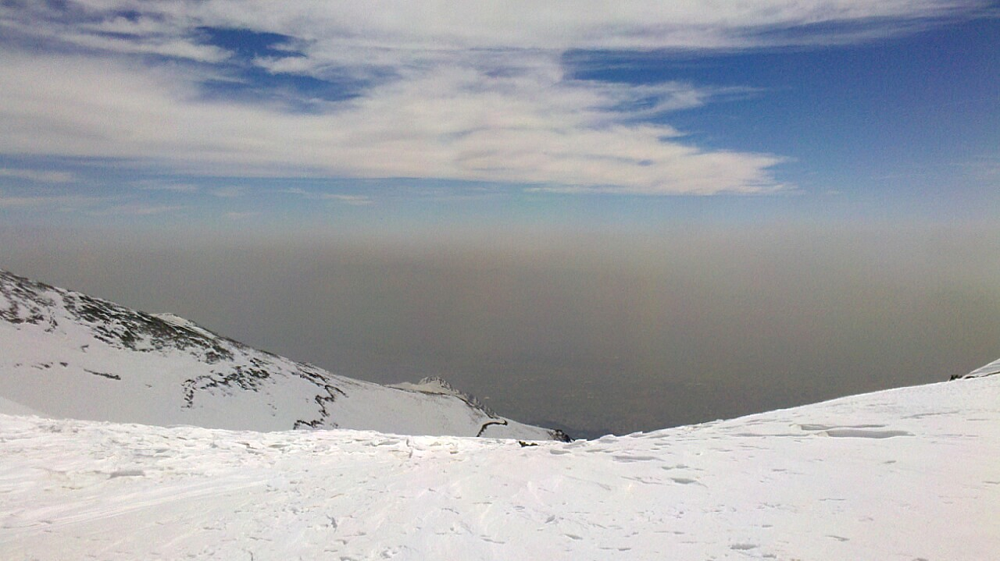

In [1]:
from IPython.display import Image
Image(filename="Tochal_sport_complex_5.jpg")


<p style="text-align: center;">Tehran, the capital of Iran, also experiences some of the highest NO2 concentrations in the world exceeding the WHO recommendation with quite a margin. The city is bound by the Alborz Mountain range which is preventing the flow of the Caspian wind over the city. The picture above shows Tehran, or rather the smog covering the city, from the peak of the mountain range. Due to this geographical location thermal inversions occur frequently, which traps the polluted air in the city [7]. The people of Tehran are greatly dependent on their cars and 80% of the air pollution in the capital is due to cars. Even though the government has tried several measures such as improving the public transport, imposing fuel rations, and setting up traffic zones to bring down the air pollution in the city, however with little success. In 2005 air pollution resulted in 10’000 premature deaths during the year and a whopping 3’600 deaths in a single month [12]. The government knows that the air pollution is of major concern for the health of the residents, which is why they are trying to raise people’s awareness about hazards of the pollution. Pollution indicator boards have been installed all around the city to monitor the current levels of e.g. PM10 and NO2, which is then communicated to the public, classified as either safe, hazardous, or dangerous. </p> 

<p style="text-align: center;">As for the five cities with the lowest NO2 concentrations, these are spread out around the world unlike the five cities with the lowest PM2.5 and PM10 concentrations. The five cities are found in New Zealand, Australia, China, Mexico, and the US. However, both Australia and New Zealand take part of first place again as they did with PM2.5 and PM10. </p>

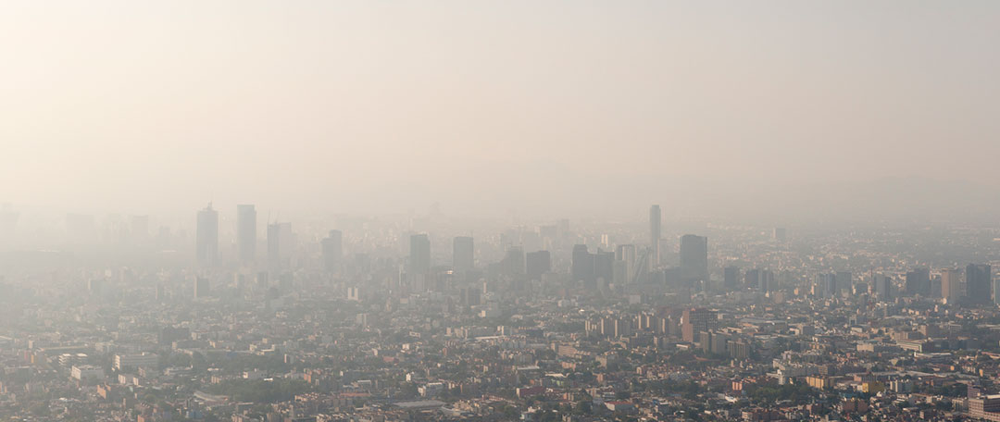

In [2]:
Image(filename="Mexico-smog-news-fuelethers-HR.jpg" )

<h6><center>
 
### A real success story    <a class="anchor" id="sixth-bullet"></a>

</center></h6>

<p style="text-align: center;">In 1992, the United Nations labelled Mexico City as “the most polluted city on the planet”. Because of the high altitude of Mexico City, the oxygen levels are 25% percent lower than at sea level, which results in fuels not being able to fully combust, leading to high levels of pollution, why the improvement of fuel quality is an important step towards better air quality. The Mexican government realised in the 1980’s that there was a major problem with air pollution in Mexico City, why they drafted a number of measures aiming to improve the air quality for the 15 million residents at the time. Thousands were being hospitalized and 1,000 premature deaths thought to be caused by airborne pollutants each year. Therefore, the government issued requirements for the petrol to be reformulated with cleaner blends for use in cars and they mandated the use of the fuel additive MTBE instead of lead-octane additives which became a popular way of reducing unwanted emissions at the time. The local bus network “Metrobús” also got heavily expanded making it more attractive, meaning that the residents weren’t as dependant on cars being their main source of transport. The expansion of the bus network alone has resulted in a reduction of 36,000 tonnes of CO2, 209 tonnes of NOx and 1.29 tonnes of PM10 particulates in just a 20-year span [8]. </p>   

<p style="text-align: center;">The wake-up call in the late 1900s helped Mexico City get on the right track and decelerate the worrisome development regarding the air pollution in the city. Through the past three decades the city has gone from being one of the most polluted cities in the world to now being outside of the top 900 worst cities. This positive change is reflected in the concentration of all three pollutants in the plot above. According to IQAir, a Swiss company which keeps track of the air quality of cities around the world, Mexico City is now the 917th most polluted city in the world and with 22 million residents in 2022, making it the 6th most populated city in the world, the Mexican government has improved the conditions for a lot of lives by taking actions through regulations and legislations. That being the case, Mexico City has set a great example of how it is possible to collectively change our mindset towards using more public transport and creating new norms, even though the situation in the city still has a long way to go of being perfect.  </p>  

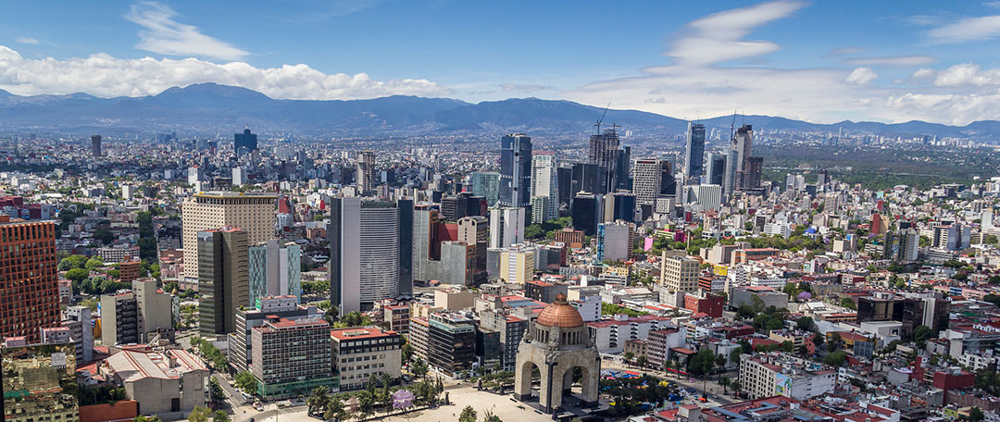

In [3]:
Image(filename="Mexico-clearsky-news-fuelethers-HR.jpg" )

<h6><center>
 
### People are dying from air pollution   <a class="anchor" id="seventh-bullet"></a>

</center></h6>

<p style="text-align: center;">As you might have experienced yourself by exploring how the concentration of the three different pollutants have changed throughout the past years within cities around the world, it is quite clear to see that India, China, and South Korea all three have several cities with some of the highest particle and pollutant concentrations in the world and that Australia and New Zealand, especially, have cities with some of the lowest concentrations. Now that we’ve looked into the air pollution, it is interesting to look into the number of premature deaths caused by air pollution. Every year 4.2 million people die prematurely from outdoor air pollution [9]. So, does India, China, and South Korea have a higher death rate due to their high pollutant concentrations? And does Australia and New Zealand have particular low death rates due to good air quality? Or are there other important factors that affects the death rate?  </p>  

<p style="text-align: center;">As we keep on growing as a population, we keep needing more space for people to live, so we expand our cities and increase our demand for transportation and energy which contributes to higher levels of air pollution. Without any precautions, we end up increasing our own risks of respiratory infections, heart diseases, and lung cancer which are some of the health issues related to air pollution that causes premature deaths.  </p>  

<p style="text-align: center;">In the interactive map below, you can explore the death rate of premature deaths caused by air pollution in different countries around the world. You can examine the death rate for every year individually or watch the change within each country throughout the years from 1990 to 2020 by using the video function.  </p>  

In [7]:
df_death = pd.read_csv(r'death-rates-total-air-pollution.csv')
df_pop = pd.read_csv(r'worldcities.csv')
death_rate = df_death['Deaths - Cause: All causes - Risk: Air pollution - Sex: Both - Age: Age-standardized (Rate)'].groupby(df_death['Year']).mean()
years = ['2021Q1', '2021Q2', '2021Q3', '2021Q4', '2020Q1', '2020Q2', '2020Q3', '2020Q4',
         '2019Q1', '2019Q2', '2019Q3', '2019Q4', '2018H1', '2017H1', '2016H1', '2015H1']
df = pd.DataFrame()  

for i in range(len(years)-1):
    filename = 'downloaded'+years[i]+'.csv'
    
    df1 = pd.read_csv(filename, skiprows=4)

    df = pd.concat([df,df1], ignore_index=True)
df_pm25 = df[df['Specie'] =='pm25']
city_list = np.unique(df_pm25['City'])
df_pm25['Date'] = pd.to_datetime(df['Date'])
list_count = []
city_count = []
for i in range(len(city_list)):
    country1 = df_pm25[df_pm25['City'] == city_list[i]]
    resampled = country1.resample('Y', on='Date', origin='start').mean()
    resampled = resampled[resampled['median'].notna()]
    resampled = resampled.reset_index()
    if len(resampled) > 6:
        list_count.append(resampled)
        city_count.append(city_list[i])
list_count_new = []
city_count_new = []
df_pop.drop_duplicates(subset ="city_ascii", keep = False, inplace = True)

for i in range(len(list_count)):
    if city_count[i] in list(df_pop['city_ascii']):
        if float(df_pop[df_pop['city_ascii'] == city_count[i]]['population']) > 1000000:
            list_count_new.append(list_count[i])
            city_count_new.append(city_count[i])

list_count = list_count_new
city_count = city_count_new
median_ave=[]
cities = []
for i in range(len(list_count)):
    median_ave.append(np.mean(list_count[i]['median']))
    cities.append(city_count[i])
aq_list_pm25 = []
lon_list_pm25 = []
lat_list_pm25 = []
city_list_pm25 = []
pop_pm25 = []
df_pop.drop_duplicates(subset ="city_ascii", keep = False, inplace = True)

for i in range(len(list_count)):
    if cities[i] in list(df_pop['city_ascii']):

        aq_list_pm25.append(median_ave[i])
        lon_list_pm25.append(float(df_pop[df_pop['city_ascii'] == cities[i]]['lng']))
        lat_list_pm25.append(float(df_pop[df_pop['city_ascii'] == cities[i]]['lat']))
        city_list_pm25.append(cities[i])
        pop_pm25.append(float(df_pop[df_pop['city_ascii'] == cities[i]]['population']))
###
df_pm25 = df[df['Specie'] =='pm10']
city_list = np.unique(df_pm25['City'])
df_pm25['Date'] = pd.to_datetime(df['Date'])
list_count = []
city_count = []
for i in range(len(city_list)):
    country1 = df_pm25[df_pm25['City'] == city_list[i]]
    resampled = country1.resample('Y', on='Date', origin='start').mean()
    resampled = resampled[resampled['median'].notna()]
    resampled = resampled.reset_index()
    if len(resampled) > 6:
        list_count.append(resampled)
        city_count.append(city_list[i])
list_count_new = []
city_count_new = []
df_pop.drop_duplicates(subset ="city_ascii", keep = False, inplace = True)


for i in range(len(list_count)):
    if city_count[i] in list(df_pop['city_ascii']):
        if float(df_pop[df_pop['city_ascii'] == city_count[i]]['population']) > 1000000:
            list_count_new.append(list_count[i])
            city_count_new.append(city_count[i])

list_count = list_count_new
city_count = city_count_new
median_ave=[]
cities = []

for i in range(len(list_count)):
    median_ave.append(np.mean(list_count[i]['median']))
    cities.append(city_count[i])
aq_list_pm10 = []
lon_list_pm10 = []
lat_list_pm10 = []
city_list_pm10 = []
pop_pm10 = []
df_pop.drop_duplicates(subset ="city_ascii", keep = False, inplace = True)


for i in range(len(list_count)):
    if cities[i] in list(df_pop['city_ascii']):

        aq_list_pm10.append(median_ave[i])
        lon_list_pm10.append(float(df_pop[df_pop['city_ascii'] == cities[i]]['lng']))
        lat_list_pm10.append(float(df_pop[df_pop['city_ascii'] == cities[i]]['lat']))
        city_list_pm10.append(cities[i])
        pop_pm10.append(float(df_pop[df_pop['city_ascii'] == cities[i]]['population']))
df_pm25 = df[df['Specie'] =='no2']
city_list = np.unique(df_pm25['City'])
df_pm25['Date'] = pd.to_datetime(df['Date'])
list_count = []
city_count = []
for i in range(len(city_list)):
    country1 = df_pm25[df_pm25['City'] == city_list[i]]
    resampled = country1.resample('Y', on='Date', origin='start').mean()
    resampled = resampled[resampled['median'].notna()]
    resampled = resampled.reset_index()
    if len(resampled) > 6:
        list_count.append(resampled)
        city_count.append(city_list[i])
list_count_new = []
city_count_new = []
df_pop.drop_duplicates(subset ="city_ascii", keep = False, inplace = True)


for i in range(len(list_count)):
    if city_count[i] in list(df_pop['city_ascii']):
        if float(df_pop[df_pop['city_ascii'] == city_count[i]]['population']) > 1000000:
            list_count_new.append(list_count[i])
            city_count_new.append(city_count[i])

list_count = list_count_new
city_count = city_count_new
median_ave=[]
cities = []
for i in range(len(list_count)):
    median_ave.append(np.mean(list_count[i]['median']))
    cities.append(city_count[i])
aq_list_no2 = []
lon_list_no2 = []
lat_list_no2 = []
city_list_no2 = []
pop_no2 = []
df_pop.drop_duplicates(subset ="city_ascii", keep = False, inplace = True)


for i in range(len(list_count)):
    if cities[i] in list(df_pop['city_ascii']):

        aq_list_no2.append(median_ave[i])
        lon_list_no2.append(float(df_pop[df_pop['city_ascii'] == cities[i]]['lng']))
        lat_list_no2.append(float(df_pop[df_pop['city_ascii'] == cities[i]]['lat']))
        city_list_no2.append(cities[i])
        pop_no2.append(float(df_pop[df_pop['city_ascii'] == cities[i]]['population']))
df_death = pd.read_csv(r'death-rates-total-air-pollution.csv')
df_death.rename(columns = {'Deaths - Cause: All causes - Risk: Air pollution - Sex: Both - Age: Age-standardized (Rate)':'Death Rate'}, inplace = True)
with urlopen('https://raw.githubusercontent.com/python-visualization/folium/main/examples/data/world-countries.json') as response:
    counties = json.load(response)
json_file_path = "world-countries.json"

with open(json_file_path, 'r') as j:
     contents = json.loads(j.read())
for i in range(len(df_death)):
    if 0 < df_death['Death Rate'][i] < 50:
        df_death['Death Rate'][i] = '50'
    elif  50 <= df_death['Death Rate'][i] < 100:
        df_death['Death Rate'][i] = '100'
    elif 100 <= df_death['Death Rate'][i] < 150:
        df_death['Death Rate'][i] = '150'
    elif 150 <= df_death['Death Rate'][i] < 200:
        df_death['Death Rate'][i] = '200'
    elif 200 <= df_death['Death Rate'][i] < 250:
        df_death['Death Rate'][i] = '250'
    elif 250 <= df_death['Death Rate'][i] < 300:
        df_death['Death Rate'][i] = '300'
    elif 300 <= df_death['Death Rate'][i] < 350:
        df_death['Death Rate'][i] = '350'
    elif 350 <= df_death['Death Rate'][i] < 400:
        df_death['Death Rate'][i] = '400'
    else:
        df_death['Death Rate'][i] = '400<'
        
for col in df_death.columns:
    df_death['Death Rate'] = df_death['Death Rate'].astype(str)
df_death = pd.read_csv(r'death-rates-total-air-pollution.csv')
df_death.rename(columns = {'Deaths - Cause: All causes - Risk: Air pollution - Sex: Both - Age: Age-standardized (Rate)':'Death Rate'}, inplace = True)
df_death['category'] = ''

cat = [50,100,150,200,250,300,350,400,450]
years = df_death['Year'].unique()

for i in range(len(years)):
    for j in range(len(cat)):
        df_death=df_death.append({'Death Rate': cat[j],'Year': years[i],'Entity': 'Afghanistan', 'Code': 'AFG'}, ignore_index=True)
        
#categorizing the number of cases and assign each category to each row
def set_cat(row):
    if row['Death Rate'] > 0 and row['Death Rate'] < 50:
        return '50'
    if row['Death Rate'] > 50 and row['Death Rate'] < 100:
        return '100'
    if row['Death Rate'] > 100 and row['Death Rate'] < 150:
        return '150'
    if row['Death Rate'] > 150 and row['Death Rate'] < 200:
        return '200'
    if row['Death Rate'] > 200 and row['Death Rate'] < 250:
        return '250'
    if row['Death Rate'] > 250 and row['Death Rate'] < 300:
        return '300'
    if row['Death Rate'] > 300 and row['Death Rate'] < 350:
        return '350'
    if row['Death Rate'] > 350 and row['Death Rate'] < 400:
        return '400'
    if row['Death Rate'] > 400:
        return '450<'

df_death = df_death.assign(category=df_death.apply(set_cat, axis=1))
df_death = pd.read_csv(r'death-rates-total-air-pollution.csv')
df_death.rename(columns = {'Deaths - Cause: All causes - Risk: Air pollution - Sex: Both - Age: Age-standardized (Rate)':'Death Rate'}, inplace = True)

colormap = [[0,'rgb(130, 210, 130)'], [0.5, 'rgb(240, 240, 120)'], [1.0, 'rgb(255, 100, 100)']]
# colormap = [[0, 'rgb(97, 210, 250)'], [1.0,'rgb(254, 41, 107)' ]]
df_death.rename(columns = {'Death Rate':'Death Rate [Death per 100k]'}, inplace = True)

fig = px.choropleth(df_death,               
                locations="Code",               
                color="Death Rate [Death per 100k]",
                color_continuous_scale=colormap,
                hover_name="Entity",  
                hover_data = {'Year': False, 'Code': False, 'Death Rate [Death per 100k]': True},
                animation_frame="Year",  
                range_color=(0, 300),
                height=600, title = 'Death Rate')

fig.update_layout(
    showlegend=True,
    legend_title_text='<b>Death Rate</b>',
    font={"size": 16, "color": "#808080", "family" : "calibri"},
    margin={"r":0,"t":40,"l":0,"b":0},
    legend=dict(orientation='v'),
    geo=dict(bgcolor='rgba(0,0,0,0)'))

fig.layout.updatemenus[0].buttons[0].args[1]['frame']['duration'] = 250
fig.layout.updatemenus[0].buttons[0].args[1]['transition']['duration'] = 15

fig.update_layout(
        geo = dict(
        showland = False,
        landcolor = "rgb(212, 212, 212)",
        subunitcolor = "rgb(255, 255, 255)",
        countrycolor = "rgb(200, 200, 200)",
        showlakes = False,
        lakecolor = "rgb(255, 255, 255)",
        showsubunits = False,
        showcountries = False))
fig.show()

<p style="text-align: center;">From the map above, you can easily tell that Africa and Asia are the two continents with the highest death rates. Both India and China had some of the highest death rates in the past. However, like the air pollution, the number of premature deaths has significantly decreased by the years. As for Australia and New Zealand, the death rate has in general been low throughout the years. In this case, the low air pollution and low death rate seems to follow each other. However, at the same time, even despite high pollutant concentrations, South Korea has always had a fairly low death rate which indicates that there is not necessarily a one-sided correlation between high pollutant concentrations and high death rates. </p>

<p style="text-align: center;">As for the six specific cities, Beijing in China, Brisbane in Australia, Copenhagen in Denmark, Kolkata in India, Mexico City in Mexico, and Tehran in Iran, the death rate of each of the six countries where the cities are located can be seen in the plot below. </p>

In [8]:
colors_top5no2 = sns.color_palette("Blues", 10).as_hex()

selectedcities = ['Kolkata','Brisbane','Beijing','Mexico City','Tehran','Copenhagen']
selectedcountries  = ['India','Australia','China','Mexico','Iran','Denmark']

n=0

p = figure(title="Death Rate", x_axis_label="Time [year]", y_axis_label="Death Rate [death per 100k]",
           plot_width=900, plot_height = 400)

for i in range(len(selectedcountries)):
    p.line(df_death[df_death['Entity']==selectedcountries[i]]['Year'], 
           df_death[df_death['Entity']==selectedcountries[i]]['Death Rate [Death per 100k]'], 
           legend_label=selectedcountries[i], line_alpha = 1, line_width=2, color = colors_top5no2[n+3])
    n+=1
    
# Create legend
p.legend.location = "top_left"
p.legend.click_policy="hide"
p.add_layout(p.legend[0], 'right')

show(p) 

<p style="text-align: center;">It is very important to note that both the pollutant concentrations and the death rates are declining which you can see from the graph above and the two previous graphs. Both India and China have experienced improvement in air quality as well as they have had a decrease of premature deaths. This promises a more green and healthy future. However, China have had a significantly larger decline in their death rate compared to India even though the change in pollutant concentrations follow each other. It is interesting to look into what other factors might cause this difference.  </p>  

<p style="text-align: center;">People who are exposed to bad air quality and experience some of the health effects of it, such as respiratory infections, heart diseases, or lung cancer, needs hospital admissions and visits to emergency rooms as well as treatments and medicine [9]. So when countries, with a large share of the population having a low- and middle-income, experience severe air pollution, they often don’t have the extra expenses for hospital bills, and therefore, they don’t seek treatment, and this can ultimately lead to them dying prematurely. When a country has a low GDP per capita, it can also indicate that the country doesn’t have the funds to build a highly developed society and are lacking proper health care services.  </p>  

<p style="text-align: center;">In the interactive map below, you can explore the gross domestic product, GDP, per capita in different countries around the world. You can examine the GDP for every year individually or watch the change within each country throughout the years from 1990 to 2020 by using the video function.  </p>  

<p style="text-align: center;">To see whether there is a correlation between the death rate and the GDP of a country, it is interesting to have a look at the previous maps and compare it with the map below. What you should be able to see is that the countries with high death rates usually also have a low GDP.   </p>  



In [9]:
df_death = pd.read_csv(r'death-rates-total-air-pollution.csv')
df_pop = pd.read_csv(r'worldcities.csv')
death_rate = df_death['Deaths - Cause: All causes - Risk: Air pollution - Sex: Both - Age: Age-standardized (Rate)'].groupby(df_death['Year']).mean()
years = ['2021Q1', '2021Q2', '2021Q3', '2021Q4', '2020Q1', '2020Q2', '2020Q3', '2020Q4',
         '2019Q1', '2019Q2', '2019Q3', '2019Q4', '2018H1', '2017H1', '2016H1', '2015H1']
df = pd.DataFrame()  
for i in range(len(years)-1):
    filename = 'downloaded'+years[i]+'.csv'
    df1 = pd.read_csv(filename, skiprows=4)
    df = pd.concat([df,df1], ignore_index=True)
df_pm25 = df[df['Specie'] =='pm25']
city_list = np.unique(df_pm25['City'])
df_pm25['Date'] = pd.to_datetime(df['Date'])
list_count = []
city_count = []
for i in range(len(city_list)):
    country1 = df_pm25[df_pm25['City'] == city_list[i]]
    resampled = country1.resample('Y', on='Date', origin='start').mean()
    resampled = resampled[resampled['median'].notna()]
    resampled = resampled.reset_index()
    if len(resampled) > 6:
        list_count.append(resampled)
        city_count.append(city_list[i])
list_count_new = []
city_count_new = []
df_pop.drop_duplicates(subset ="city_ascii", keep = False, inplace = True)

for i in range(len(list_count)):
    if city_count[i] in list(df_pop['city_ascii']):
        if float(df_pop[df_pop['city_ascii'] == city_count[i]]['population']) > 1000000:
            list_count_new.append(list_count[i])
            city_count_new.append(city_count[i])

list_count = list_count_new
city_count = city_count_new
median_ave=[]
cities = []
for i in range(len(list_count)):
    median_ave.append(np.mean(list_count[i]['median']))
    cities.append(city_count[i])
aq_list_pm25 = []
lon_list_pm25 = []
lat_list_pm25 = []
city_list_pm25 = []
pop_pm25 = []
df_pop.drop_duplicates(subset ="city_ascii", keep = False, inplace = True)

for i in range(len(list_count)):
    if cities[i] in list(df_pop['city_ascii']):

        aq_list_pm25.append(median_ave[i])
        lon_list_pm25.append(float(df_pop[df_pop['city_ascii'] == cities[i]]['lng']))
        lat_list_pm25.append(float(df_pop[df_pop['city_ascii'] == cities[i]]['lat']))
        city_list_pm25.append(cities[i])
        pop_pm25.append(float(df_pop[df_pop['city_ascii'] == cities[i]]['population']))
###
df_pm25 = df[df['Specie'] =='pm10']
city_list = np.unique(df_pm25['City'])
df_pm25['Date'] = pd.to_datetime(df['Date'])
list_count = []
city_count = []
for i in range(len(city_list)):
    country1 = df_pm25[df_pm25['City'] == city_list[i]]
    resampled = country1.resample('Y', on='Date', origin='start').mean()
    resampled = resampled[resampled['median'].notna()]
    resampled = resampled.reset_index()
    if len(resampled) > 6:
        list_count.append(resampled)
        city_count.append(city_list[i])
list_count_new = []
city_count_new = []
df_pop.drop_duplicates(subset ="city_ascii", keep = False, inplace = True)


for i in range(len(list_count)):
    if city_count[i] in list(df_pop['city_ascii']):
        if float(df_pop[df_pop['city_ascii'] == city_count[i]]['population']) > 1000000:
            list_count_new.append(list_count[i])
            city_count_new.append(city_count[i])

list_count = list_count_new
city_count = city_count_new
median_ave=[]
cities = []
for i in range(len(list_count)):
    median_ave.append(np.mean(list_count[i]['median']))
    cities.append(city_count[i])
aq_list_pm10 = []
lon_list_pm10 = []
lat_list_pm10 = []
city_list_pm10 = []
pop_pm10 = []
df_pop.drop_duplicates(subset ="city_ascii", keep = False, inplace = True)

for i in range(len(list_count)):
    if cities[i] in list(df_pop['city_ascii']):

        aq_list_pm10.append(median_ave[i])
        lon_list_pm10.append(float(df_pop[df_pop['city_ascii'] == cities[i]]['lng']))
        lat_list_pm10.append(float(df_pop[df_pop['city_ascii'] == cities[i]]['lat']))
        city_list_pm10.append(cities[i])
        pop_pm10.append(float(df_pop[df_pop['city_ascii'] == cities[i]]['population']))
df_pm25 = df[df['Specie'] =='no2']
city_list = np.unique(df_pm25['City'])
df_pm25['Date'] = pd.to_datetime(df['Date'])
list_count = []
city_count = []
for i in range(len(city_list)):
    country1 = df_pm25[df_pm25['City'] == city_list[i]]
    resampled = country1.resample('Y', on='Date', origin='start').mean()
    resampled = resampled[resampled['median'].notna()]
    resampled = resampled.reset_index()
    if len(resampled) > 6:
        list_count.append(resampled)
        city_count.append(city_list[i])
list_count_new = []
city_count_new = []
df_pop.drop_duplicates(subset ="city_ascii", keep = False, inplace = True)

for i in range(len(list_count)):
    if city_count[i] in list(df_pop['city_ascii']):
        if float(df_pop[df_pop['city_ascii'] == city_count[i]]['population']) > 1000000:
            list_count_new.append(list_count[i])
            city_count_new.append(city_count[i])

list_count = list_count_new
city_count = city_count_new
median_ave=[]
cities = []
for i in range(len(list_count)):
    median_ave.append(np.mean(list_count[i]['median']))
    cities.append(city_count[i])
aq_list_no2 = []
lon_list_no2 = []
lat_list_no2 = []
city_list_no2 = []
pop_no2 = []
df_pop.drop_duplicates(subset ="city_ascii", keep = False, inplace = True)

for i in range(len(list_count)):
    if cities[i] in list(df_pop['city_ascii']):

        aq_list_no2.append(median_ave[i])
        lon_list_no2.append(float(df_pop[df_pop['city_ascii'] == cities[i]]['lng']))
        lat_list_no2.append(float(df_pop[df_pop['city_ascii'] == cities[i]]['lat']))
        city_list_no2.append(cities[i])
        pop_no2.append(float(df_pop[df_pop['city_ascii'] == cities[i]]['population']))
df_death = pd.read_csv(r'death-rates-total-air-pollution.csv')
df_death.rename(columns = {'Deaths - Cause: All causes - Risk: Air pollution - Sex: Both - Age: Age-standardized (Rate)':'Death Rate'}, inplace = True)
with urlopen('https://raw.githubusercontent.com/python-visualization/folium/main/examples/data/world-countries.json') as response:
    counties = json.load(response)
json_file_path = "world-countries.json"

with open(json_file_path, 'r') as j:
     contents = json.loads(j.read())
colors_top = sns.color_palette("YlOrBr", 10).as_hex()

In [10]:
with urlopen('https://raw.githubusercontent.com/python-visualization/folium/main/examples/data/world-countries.json') as response:
    counties = json.load(response)

df_gdp = pd.read_csv(r'gdp-per-capita-worldbank.csv')
df_gdp.rename(columns = {'GDP per capita, PPP (constant 2017 international $)':'GDP [USD per capita]'}, inplace = True)
df_gdp.sort_values('Year', ascending=True, ignore_index=True, inplace=True)

colormap = [[0, 'rgb(255, 100, 100)'], [0.5, 'rgb(240, 240, 120)'], [1.0, 'rgb(130, 210, 130)']]

fig = px.choropleth(df_gdp,               
            locations="Code",               
            color="GDP [USD per capita]",
            color_continuous_scale=colormap,
            hover_name="Entity", 
            hover_data = {'Year': False, 'Code': False, 'GDP [USD per capita]': True},
            animation_frame="Year",  
            range_color=(0,60000),
            height=600, title = 'Gross Domestic Product')

fig.update_layout(
    showlegend=True,
    legend_title_text='<b>GDP</b>',
    font={"size": 16, "color": "#808080", "family" : "calibri"},
    margin={"r":0,"t":40,"l":0,"b":0},
    legend=dict(orientation='v'),
    geo=dict(bgcolor='rgba(0,0,0,0)'))

fig.update_layout(
        geo = dict(
        showland = False,
        landcolor = "rgb(212, 212, 212)",
        subunitcolor = "rgb(255, 255, 255)",
        countrycolor = "rgb(200, 200, 200)",
        showlakes = False,
        lakecolor = "rgb(255, 255, 255)",
        showsubunits = False,
        showcountries = False))

fig.layout.updatemenus[0].buttons[0].args[1]['frame']['duration'] = 250
fig.layout.updatemenus[0].buttons[0].args[1]['transition']['duration'] = 15

fig.show()


<p style="text-align: center;"> As for the six specific cities, the GDP per capita of each of the six countries where the cities are located can be seen in the plot below.  
</p>  


In [11]:
colors_top5no2 = sns.color_palette("Blues", 10).as_hex()


selectedcities = ['Kolkata','Brisbane','Beijing','Mexico City','Tehran','Copenhagen']
selectedcountries  = ['India','Australia','China','Mexico','Iran','Denmark']

n=0

p = figure(title="Gross Domestic Product", x_axis_label="Time [year]", y_axis_label="USD per capita",
           plot_width=900, plot_height = 400)

for i in range(len(selectedcountries)):
    p.line(df_gdp[df_gdp['Entity']==selectedcountries[i]]['Year'], df_gdp[df_gdp['Entity']==selectedcountries[i]]['GDP [USD per capita]'], 
           legend_label=selectedcountries[i], line_alpha = 1, line_width=2, color = colors_top5no2[n+3])
    n+=1
    
# Create legend
p.legend.location = "top_left"
p.legend.click_policy="hide"
p.add_layout(p.legend[0], 'right')

show(p)

<p style="text-align: center;">From the plot, you can see that all countries have an increasing GDP per capita, some experiencing a larger increase than others. Thereby, the past years have resulted in lower pollutant concentrations, lower death rates, and higher GDPs per capita.</p>  
  
<h6><center>
 
### Why are we dying of air pollution? <a class="anchor" id="eight-bullet"></a>

</center></h6>

<p style="text-align: center;">From the two maps above showing the death rate from air pollution and the GDP per capita of different countries in the world, it is clear to see that it is in fact countries with a low GDP per capita who experience a higher rate of premature deaths related to air pollution. When looking at the graphs showing the death rate and the GDP per capita for the countries in which the six cities are located the possible correlation between the two becomes even more detectable. When comparing India and China for instance, both countries have a very similar deathrate in the early 1990’s but throughout the years the deathrate in China has declined steeply while that of India hasn’t had as steep a decline, resulting in a deathrate of around 100 and 160 deaths per 100,000 respectively in 2020. We know that both China and India have some of the most polluted and populated cities in the world as a result of their rapid industrial development. Coal is responsible for about 40% of the PM2.5 in China’s atmosphere, why the population of China consumes almost as much coal annually as all other countries combined [16]. So why is it that the percentage difference between the two deathrates in 2020 is that high? An answer to this question could be found in the rise of the Chinese middle class. In 2000, China’s middle class amounted to just three percent of its population, however already in 2018 the middle class represent more than half of the population [17]. As mentioned earlier the health effects caused by air pollution, needs hospital admissions and visits to emergency rooms as well as treatments and medicine, which have now become more accessible to the average Chinese. The economic growth in China can also be seen in the GDP per capita on the plot above. The trendline of the GDP per capita for both China and India is somewhat inverse proportional to the trendlines of their deathrates. This suggests that there could be a strong correlation between the wealth of a country and the deathrate due to air pollution. However, even though deathrates are reclining across the world, we are generally still far from the WHO air quality guidelines, which have been issued to ensure good health and well-being of the world’s population. 
</p>  
 

<h6><center>
 
### What does the future hold for us?  <a class="anchor" id="ninth-bullet"></a>

</center></h6>


<p style="text-align: center;">In an effort to improve the health and wealth of the people and the planet, the UN took on a plan of action for people, planet, and prosperity in 2015 which included 17 goals known as the Sustainable Development Goals, SDGs. The 17 goals include ending hunger and poverty as well as ensuring quality education, clean water, and gender equality, among other things. Especially two of the goals, SDG 3, Good Health and Well-being, and SDG 11, Sustainable Cities and Communities, are both targeting air pollution. SDG 3 states that healthy lives and well-being for everybody at all ages must be ensured and SDG 11 states that cities and human settlements must be inclusive, safe, resilient, and sustainable. </p>  


<p style="text-align: center;">More specifically, Target 3.9 is about reducing illnesses and death from hazardous chemicals and pollution. The target states that by 2030, the number of deaths and illnesses from hazardous chemicals and air, water and soil pollution and contamination must be substantially reduced [2]. On the other hand, Target 11.6, that is about reducing the environmental impact of cities, states that by 2030, the adverse per capita environmental impact of cities, including by paying special attention to air quality and municipal and other waste management must be reduced [3]. So the two SDGs are both targeting air pollution. However, they have different approaches in order to improve the air quality and different aims in doing so.  </p>  

<p style="text-align: center;">To meet these sustainable development goals, WHO has provided global air quality guidelines on the 22nd of September 2021, which include recommended maximum concentration levels of six different pollutants, including PM2.5, PM10, and NO2.  </p>    

<p style="text-align: center;">As previously stated, even in 2019, more than 90% of the global population lived in areas where concentrations exceeded the WHO guidelines from 2005 for long term exposure to PM2.5, but if the current air pollution levels were reduced to those proposed in the new guidelines from September 2021, almost 80% of deaths related to PM2.5 could be avoided, according to WHO [4].  </p>  

<p style="text-align: center;">As you have probably already concluded from exploring and examining the graphs and maps above, a high number of premature deaths caused by air pollution is usually linked to high pollutant concentrations. However, it is clear that the gross domestic product per capita of a country also affects the death rate as well as it also affects the air pollution. As air pollution affects both people and the planet, it should be a pretty simple decision to go all in on reducing pollutant concentrations in order to reduce diseases that causes premature deaths as well as limit contributions to climate changes.   </p>  



<h6><center>
 
### References<a class="anchor" id="tenth-bullet"></a>

</center></h6>

[1] https://www.who.int/health-topics/air-pollution#tab=tab_1 

[2] https://www.globalgoals.org/goals/3-good-health-and-well-being/ 

[3] https://www.globalgoals.org/goals/11-sustainable-cities-and-communities/ 

[4] https://www.who.int/news/item/22-09-2021-new-who-global-air-quality-guidelines-aim-to-save-millions-of-lives-from-air-pollution 

[5] https://www.science.org.au/curious/people-medicine/air-pollution-whats-situation 

[6] https://www.nkrealtors.com/blog/kolkata-air-quality-cause-concern/  

[7] https://en.wikipedia.org/wiki/Environmental_issues_in_Tehran  

[8] https://globalfuelethers.com/news/mexico-city-clean-air/ 

[9] https://www.who.int/news-room/fact-sheets/detail/ambient-(outdoor)-air-quality-and-health  

[10] https://www.cdc.gov/air/particulate_matter.html  

[11] https://www.awe.gov.au/environment/protection/air-quality/national-clean-air-agreement  

[12] http://news.bbc.co.uk/2/hi/middle_east/6245463.stm  

[13] https://www.env.go.jp/en/coop/experience.html  

[14] https://www.nature.com/articles/s41598-021-91637-x  

[15] https://www.privacyshield.gov/article?id=Korea-Air-Pollution-Control  

[16] https://www.nytimes.com/2016/08/18/world/asia/china-coal-health-smog-pollution.html  

[17] https://chinapower.csis.org/china-middle-class  

In [1]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')